<ipython-input-30-b4e2756441f2>:6: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IC) # visualize image
<ipython-input-30-b4e2756441f2>:7: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()


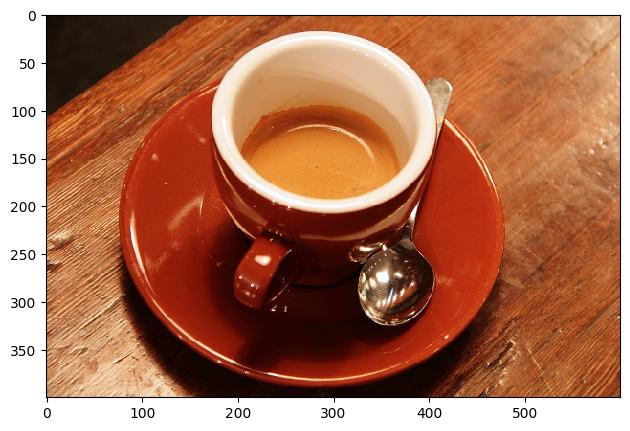

M = 400 columns, N = 600 rows, NC = 3 color channels


In [30]:
import skimage as sk # load skimage libraries
from skimage.io import imread
import numpy as np
IC = sk.data.coffee()
ICfloat = sk.img_as_float(IC)
sk.io.imshow(IC) # visualize image
sk.io.show()
print('M = {} columns, N = {} rows, NC = {} color channels'.format(*IC.shape))

<ipython-input-31-e0015bc4dae3>:6: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IG)


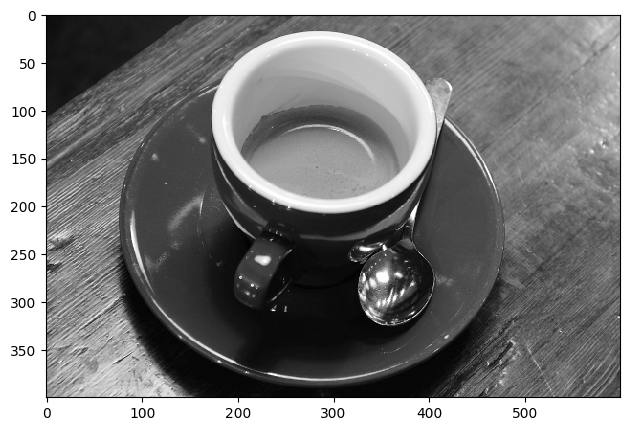

In [31]:
# Convert the image to grayscale
IG = sk.color.rgb2gray(IC)
IGfloat = sk.img_as_float(IG)
IG.shape
IGfloat.shape
sk.io.imshow(IG)

### Applying noise to the colored image

In [32]:
# Gaussian-distributed additive noise
gaussian = sk.util.random_noise(ICfloat, mode='gaussian', mean=0, var=0.01)

# Gaussian-distributed additive noise, with specified local variance at each point of image
local_var_map = 0.02 * np.ones_like(ICfloat)
localvar = sk.util.random_noise(ICfloat, mode='localvar', local_vars=local_var_map)

# Poisson-distributed noise
poisson = sk.util.random_noise(ICfloat, mode='poisson')

# Salt - replaces random pixels with 1
salt = sk.util.random_noise(ICfloat, mode='salt', amount=0.05)

# Pepper - replaces random pixels with 0 (for unsigned images) or -1 (for signed images)
pepper = sk.util.random_noise(ICfloat, mode='pepper', amount=0.05)

# Salt&Pepper - replaces random pixels with either 1 or, 0 (for unsigned images) or -1 for signed images
snp = sk.util.random_noise(ICfloat, mode='s&p', amount=0.05)

# Speckle - multiplicative noise using out = image + n*image, where n is Gaussian noise with specified mean & variance
speckle = sk.util.random_noise(ICfloat, mode='speckle', mean=0, var=0.04)

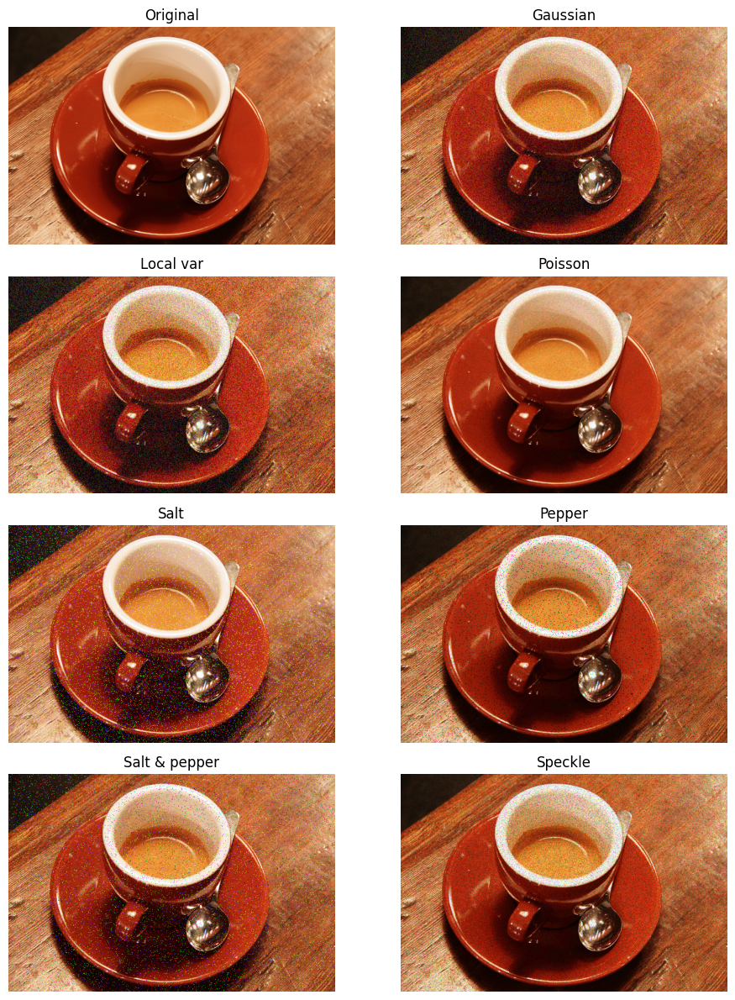

In [33]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(4, 2, figsize=(10, 12))
imgs = [ICfloat, gaussian, localvar, poisson, salt, pepper, snp, speckle]
titles = ['Original', 'Gaussian', 'Local var', 'Poisson',
          'Salt', 'Pepper', 'Salt & pepper', 'Speckle']

for a, im, t in zip(ax.ravel(), imgs, titles):
    a.imshow(np.clip(im, 0, 1))
    a.set_title(t); a.axis('off')

plt.tight_layout()
plt.show()

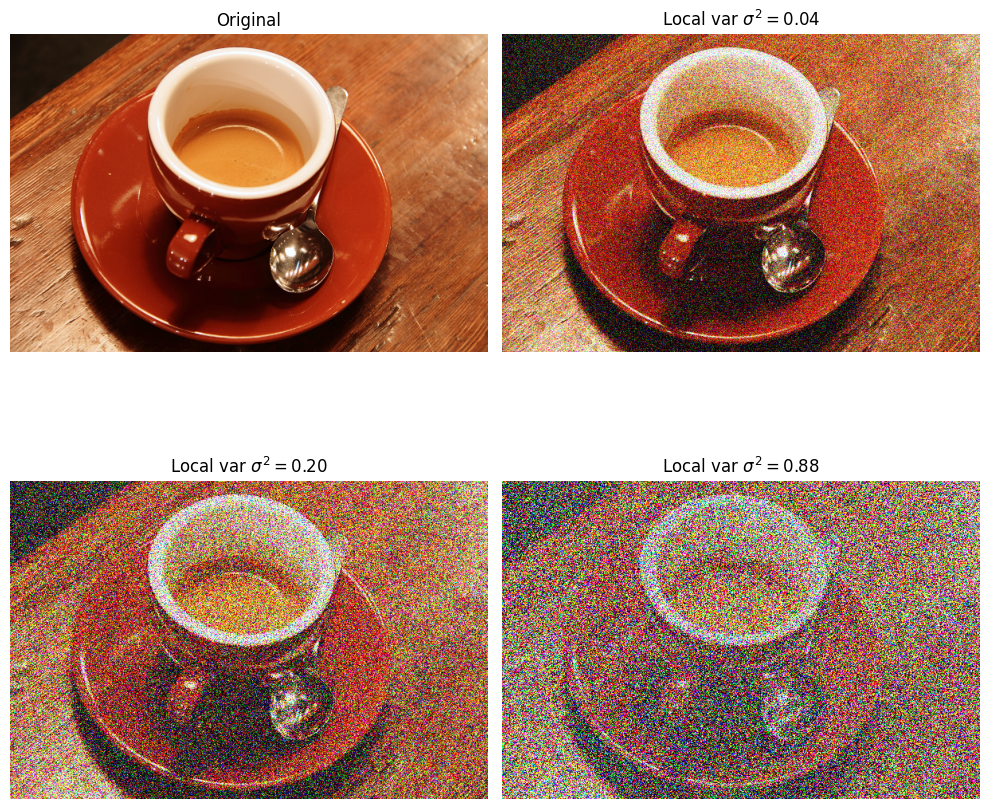

In [34]:
# Gaussian-distributed additive noise, with specified local variance at each point of image 0.04
local_var_map_1 = 0.04 * np.ones_like(ICfloat)
localvar_1 = sk.util.random_noise(ICfloat, mode='localvar', local_vars=local_var_map_1)

# Gaussian-distributed additive noise, with specified local variance at each point of image 0.2
local_var_map_2 = 0.2 * np.ones_like(ICfloat)
localvar_2 = sk.util.random_noise(ICfloat, mode='localvar', local_vars=local_var_map_2)

# Gaussian-distributed additive noise, with specified local variance at each point of image 0.88
local_var_map_3 = 0.88 * np.ones_like(ICfloat)
localvar_3 = sk.util.random_noise(ICfloat, mode='localvar', local_vars=local_var_map_3)

# Display in a 2×2 figure
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
images = [
    ICfloat,           # original grayscale (float, 0‒1)
    localvar_1,   # σ² = 0.04
    localvar_2,   # σ² = 0.20
    localvar_3    # σ² = 0.88
]

titles = [
    'Original',
    r'Local var $\sigma^2 = 0.04$',
    r'Local var $\sigma^2 = 0.20$',
    r'Local var $\sigma^2 = 0.88$'
]

for axis, img, title in zip(ax.ravel(), images, titles):
    axis.imshow(np.clip(img, 0, 1), cmap='gray', vmin=0, vmax=1)
    axis.set_title(title)
    axis.axis('off')

plt.tight_layout()
plt.show()

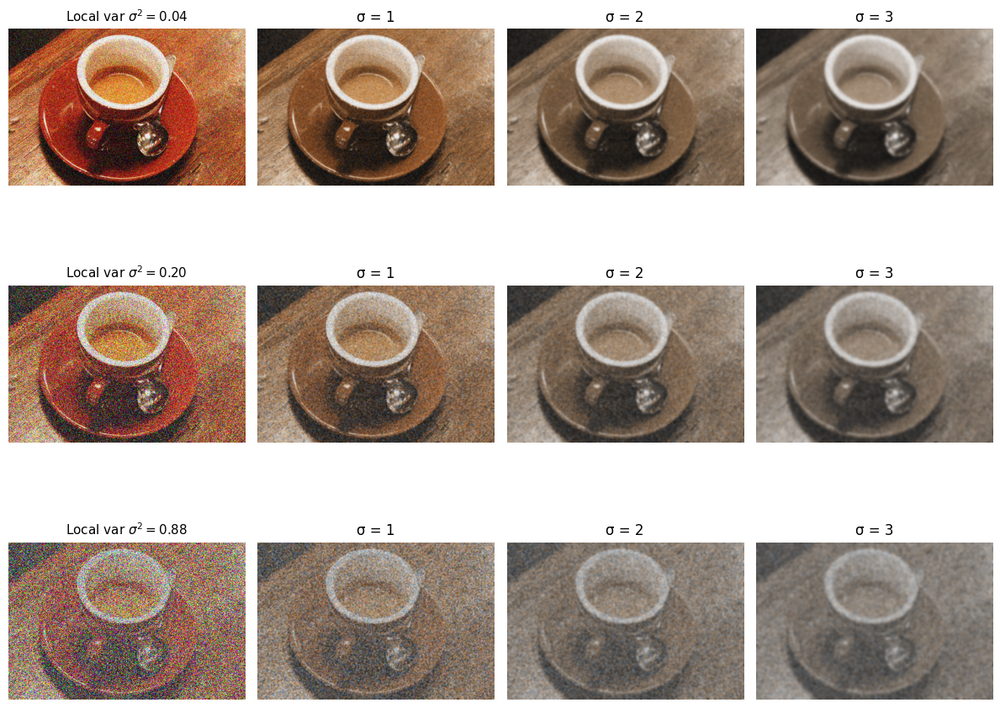

In [36]:
from skimage.filters import gaussian

sigmas = [1, 2, 3]          # low → medium → strong smoothing

noisy_imgs = [localvar_1, localvar_2, localvar_3]
sigma_labels = [rf'σ = {s}' for s in sigmas]

# Pre-compute all filtered versions
filtered_sets = [
    [gaussian(img, sigma=s, preserve_range=True) for s in sigmas]
    for img in noisy_imgs
]

# Display the 3 × 4 grid
fig, ax = plt.subplots(len(noisy_imgs), len(sigmas) + 1,
                       figsize=(12, 10))

row_titles = [r'Local var $\sigma^2=0.04$',
              r'Local var $\sigma^2=0.20$',
              r'Local var $\sigma^2=0.88$']

for r, (noisy, row_title, filt_imgs) in enumerate(
        zip(noisy_imgs, row_titles, filtered_sets)):

    # left-most: the noisy input itself
    ax[r, 0].imshow(np.clip(noisy, 0, 1), cmap='gray', vmin=0, vmax=1)
    ax[r, 0].set_title(row_title, fontsize=11)
    ax[r, 0].axis('off')

    # subsequent columns: σ-filtered versions
    for c, (filt, s) in enumerate(zip(filt_imgs, sigmas), start=1):
        ax[r, c].imshow(np.clip(filt, 0, 1), cmap='gray', vmin=0, vmax=1)
        ax[r, c].set_title(sigma_labels[c - 1])
        ax[r, c].axis('off')

plt.tight_layout()
plt.show()

### Applying noise to the grayscale image

In [37]:
# Gaussian-distributed additive noise
gaussian_gray = sk.util.random_noise(IG, mode='gaussian', mean=0, var=0.01)

# Gaussian-distributed additive noise, with specified local variance at each point of image
local_var_map_gray = 0.02 * np.ones_like(IGfloat)
localvar_gray = sk.util.random_noise(IGfloat, mode='localvar', local_vars=local_var_map_gray)

# Poisson-distributed noise
poisson_gray = sk.util.random_noise(IGfloat, mode='poisson')

# Salt - replaces random pixels with 1
salt_gray = sk.util.random_noise(IGfloat, mode='salt', amount=0.05)

# Pepper - replaces random pixels with 0 (for unsigned images) or -1 (for signed images)
pepper_gray = sk.util.random_noise(IGfloat, mode='pepper', amount=0.05)

# Salt&Pepper - replaces random pixels with either 1 or, 0 (for unsigned images) or -1 for signed images
snp_gray = sk.util.random_noise(IGfloat, mode='s&p', amount=0.05)

# Speckle - multiplicative noise using out = image + n*image, where n is Gaussian noise with specified mean & variance
speckle_gray = sk.util.random_noise(IGfloat, mode='speckle', mean=0, var=0.04)

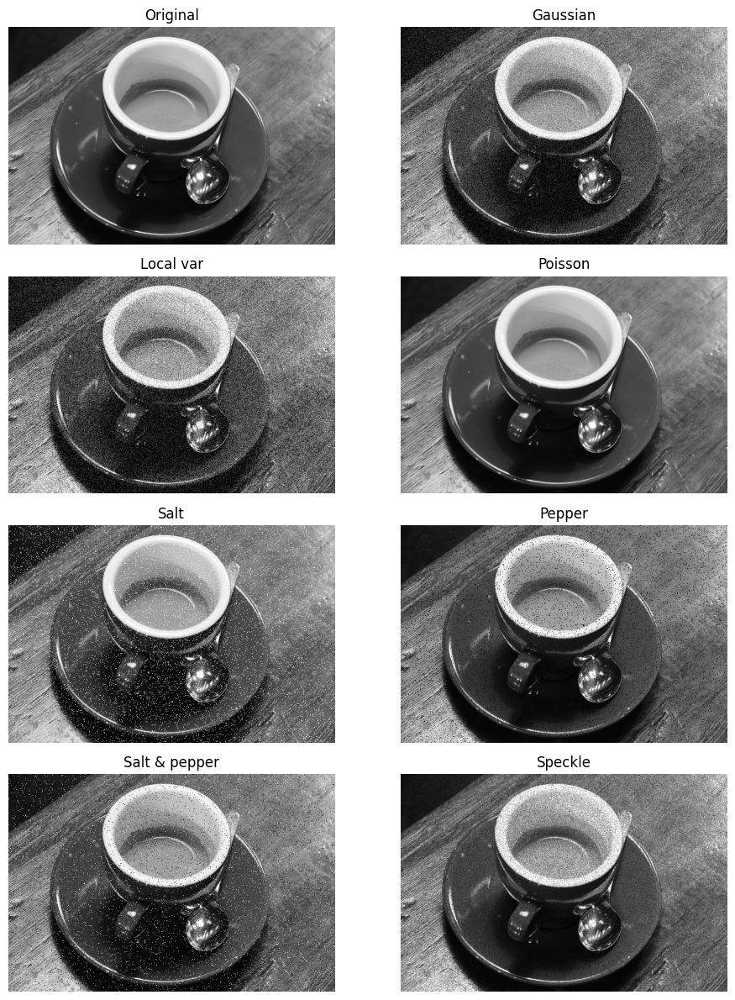

In [38]:
fig, ax = plt.subplots(4, 2, figsize=(10, 12))
imgs = [IG, gaussian_gray, localvar_gray, poisson_gray, salt_gray, pepper_gray, snp_gray, speckle_gray]
titles = ['Original', 'Gaussian', 'Local var', 'Poisson',
          'Salt', 'Pepper', 'Salt & pepper', 'Speckle']

for a, im, t in zip(ax.ravel(), imgs, titles):
    a.imshow(np.clip(im, 0, 1), cmap='gray', vmin=0, vmax=1)
    a.set_title(t); a.axis('off')

plt.tight_layout()
plt.show()

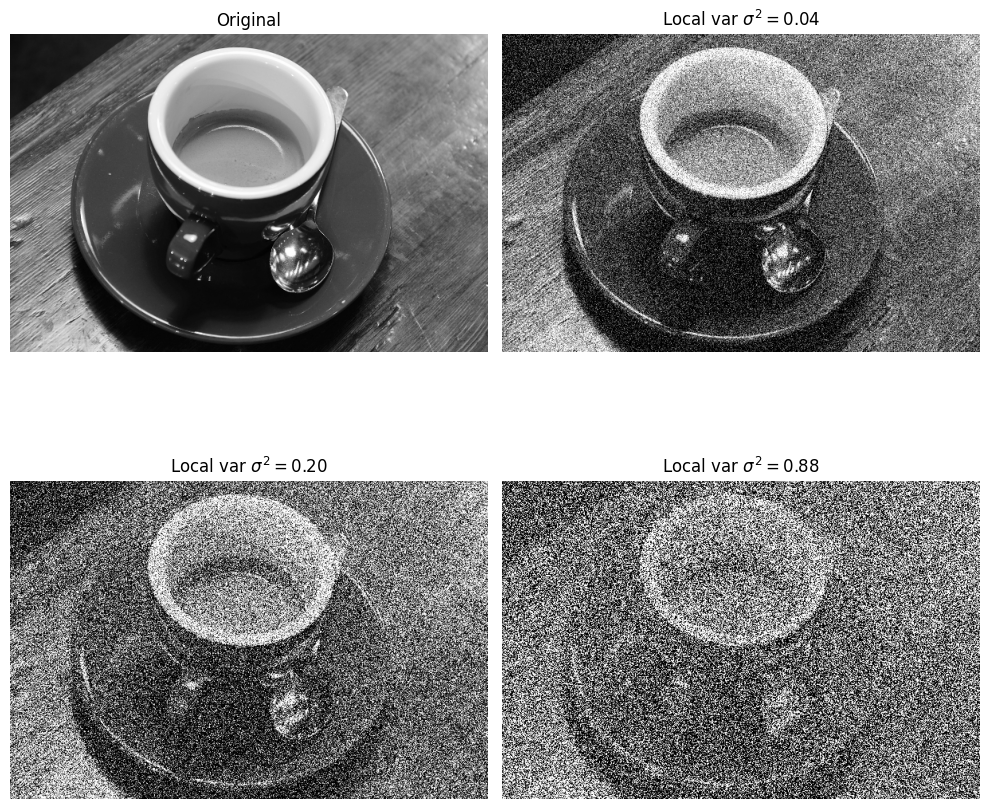

In [39]:
# Gaussian-distributed additive noise, with specified local variance at each point of image 0.04
local_var_map_gray_1 = 0.04 * np.ones_like(IGfloat)
localvar_gray_1 = sk.util.random_noise(IGfloat, mode='localvar', local_vars=local_var_map_gray_1)

# Gaussian-distributed additive noise, with specified local variance at each point of image 0.2
local_var_map_gray_2 = 0.2 * np.ones_like(IGfloat)
localvar_gray_2 = sk.util.random_noise(IGfloat, mode='localvar', local_vars=local_var_map_gray_2)

# Gaussian-distributed additive noise, with specified local variance at each point of image 0.88
local_var_map_gray_3 = 0.88 * np.ones_like(IGfloat)
localvar_gray_3 = sk.util.random_noise(IGfloat, mode='localvar', local_vars=local_var_map_gray_3)

# Display in a 2×2 figure
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
images = [
    IGfloat,           # original grayscale (float, 0‒1)
    localvar_gray_1,   # σ² = 0.04
    localvar_gray_2,   # σ² = 0.20
    localvar_gray_3    # σ² = 0.88
]

titles = [
    'Original',
    r'Local var $\sigma^2 = 0.04$',
    r'Local var $\sigma^2 = 0.20$',
    r'Local var $\sigma^2 = 0.88$'
]

for axis, img, title in zip(ax.ravel(), images, titles):
    axis.imshow(np.clip(img, 0, 1), cmap='gray', vmin=0, vmax=1)
    axis.set_title(title)
    axis.axis('off')

plt.tight_layout()
plt.show()

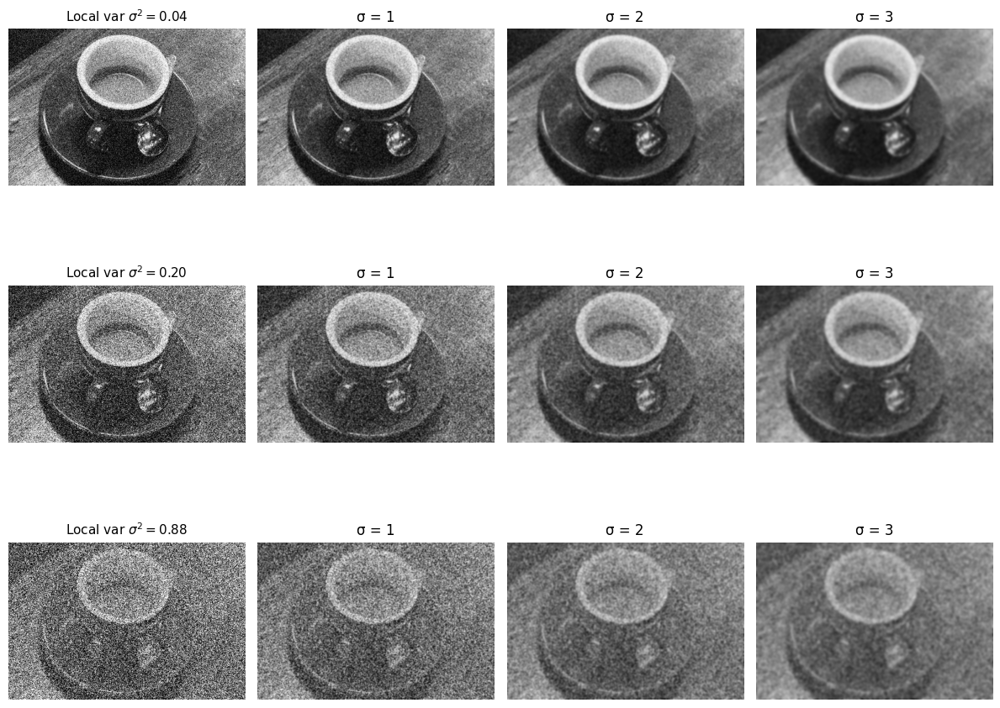

In [40]:
from skimage.filters import gaussian

sigmas = [1, 2, 3]          # low → medium → strong smoothing

noisy_imgs = [localvar_gray_1, localvar_gray_2, localvar_gray_3]
sigma_labels = [rf'σ = {s}' for s in sigmas]

# Pre-compute all filtered versions
filtered_sets = [
    [gaussian(img, sigma=s, preserve_range=True) for s in sigmas]
    for img in noisy_imgs
]

# Display the 3 × 4 grid
fig, ax = plt.subplots(len(noisy_imgs), len(sigmas) + 1,
                       figsize=(12, 10))

row_titles = [r'Local var $\sigma^2=0.04$',
              r'Local var $\sigma^2=0.20$',
              r'Local var $\sigma^2=0.88$']

for r, (noisy, row_title, filt_imgs) in enumerate(
        zip(noisy_imgs, row_titles, filtered_sets)):

    # left-most: the noisy input itself
    ax[r, 0].imshow(np.clip(noisy, 0, 1), cmap='gray', vmin=0, vmax=1)
    ax[r, 0].set_title(row_title, fontsize=11)
    ax[r, 0].axis('off')

    # subsequent columns: σ-filtered versions
    for c, (filt, s) in enumerate(zip(filt_imgs, sigmas), start=1):
        ax[r, c].imshow(np.clip(filt, 0, 1), cmap='gray', vmin=0, vmax=1)
        ax[r, c].set_title(sigma_labels[c - 1])
        ax[r, c].axis('off')

plt.tight_layout()
plt.show()

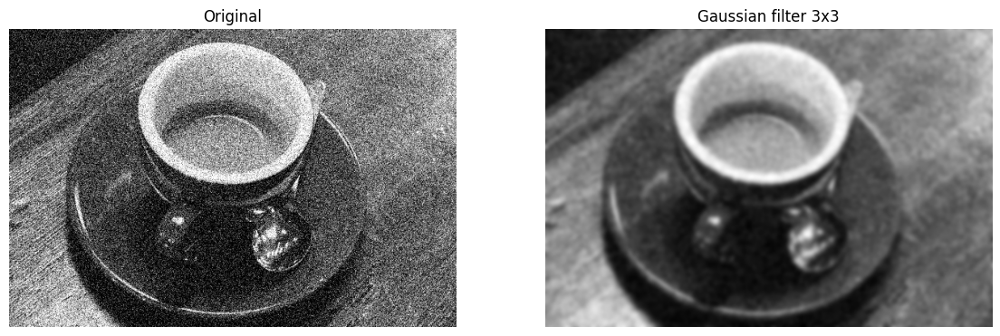

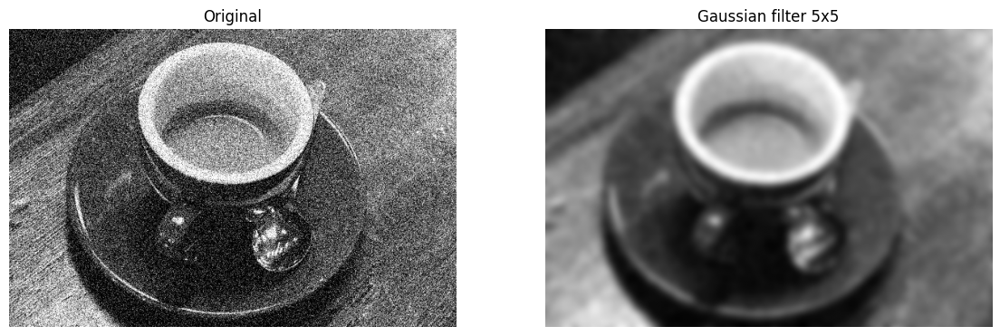

In [41]:
from skimage.filters import gaussian
from skimage.color import rgb2gray

def plot_comparison(original, filtered, filter_name):

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 6), sharex=True,
                                   sharey=True)
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title('Original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(filter_name)
    ax2.axis('off')

img_f = gaussian(localvar_gray_1, 3)
plot_comparison(localvar_gray_1, img_f, 'Gaussian filter 3x3')


img_f = gaussian(localvar_gray_1, 5)
plot_comparison(localvar_gray_1, img_f, 'Gaussian filter 5x5')

## Results
For the light-noise row (σ² = 0.04), σ = 1 is already enough; larger kernels mostly blur detail rather than improve. The same thing is also detected for the medium and high noise row.
It can be observed that σ = 2 and σ = 3 oversmooths the images.
On the last image, where the variance is the highest, it can be seen that the gaussian filter doesn't make much of a difference in reducing the noise of the image.

<ipython-input-42-0a78686441fd>:2: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()
<ipython-input-42-0a78686441fd>:3: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IG)


Grayscale image (1 channel)


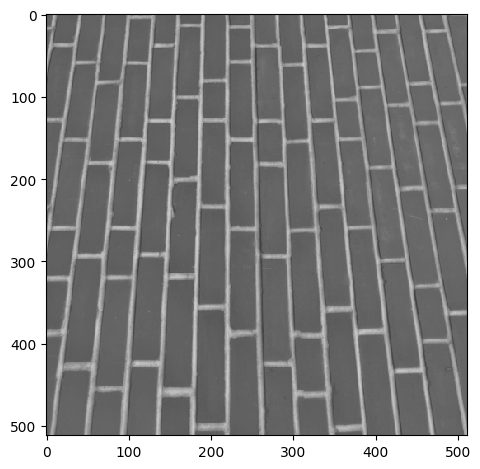

In [42]:
IG = sk.data.brick()
sk.io.show()
sk.io.imshow(IG)

# Find whether the image is grayscale or RGB by the number of channels it has
if IG.ndim == 2:
    print("Grayscale image (1 channel)")
    num_channels = 1
elif IG.ndim == 3:
    num_channels = IG.shape[2]
    print(f"Color image with {num_channels} channels")
else:
    print("Unexpected image format")

Edge pixels : 20.21%
Brick pixels: 79.79%


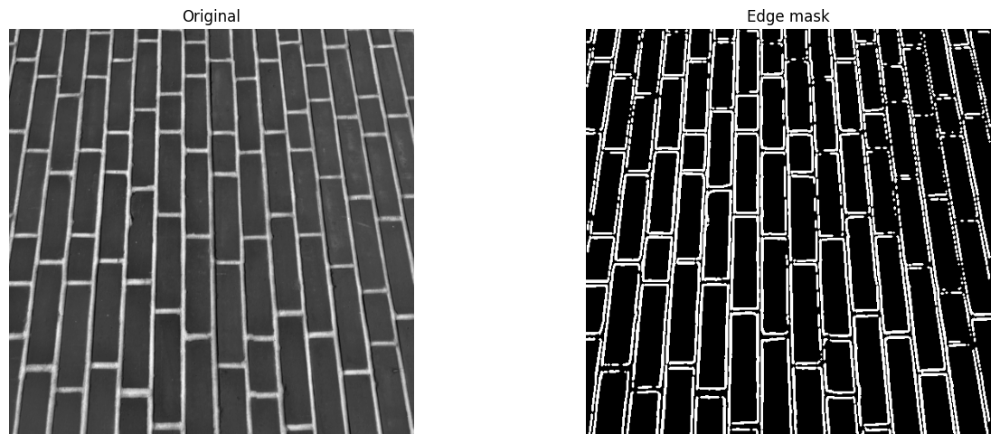

In [43]:
from skimage.filters import prewitt, threshold_otsu
from skimage.morphology import binary_opening, disk

# Mild smoothing to reduce sensor grain
IG_smooth = gaussian(IG, sigma=1, preserve_range=True)

# Prewitt gradient magnitude
grad = prewitt(IG_smooth)

# Automatic threshold to pick “strong” edges
T = threshold_otsu(grad) * 1.2 # Otsu, then relax (×1.2) to keep only bold edges
edge_mask = grad > T # boolean mask: True = edge pixel

# Morphological clean-up
edge_mask = binary_opening(edge_mask, disk(1)) # remove specks, mend tiny gaps

# Statistics
edge_fraction  = edge_mask.mean() # fraction of True (edge) pixels
brick_fraction = 1 - edge_fraction

print(f'Edge pixels : {edge_fraction :6.2%}')
print(f'Brick pixels: {brick_fraction:6.2%}')


fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].imshow(IG, cmap='gray');
ax[0].set_title('Original'); ax[0].axis('off')
ax[1].imshow(edge_mask, cmap='gray');
ax[1].set_title('Edge mask'); ax[1].axis('off')
plt.tight_layout();
plt.show()

<ipython-input-44-050bbd31e2da>:2: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()
<ipython-input-44-050bbd31e2da>:3: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IG)


Grayscale image (1 channel)


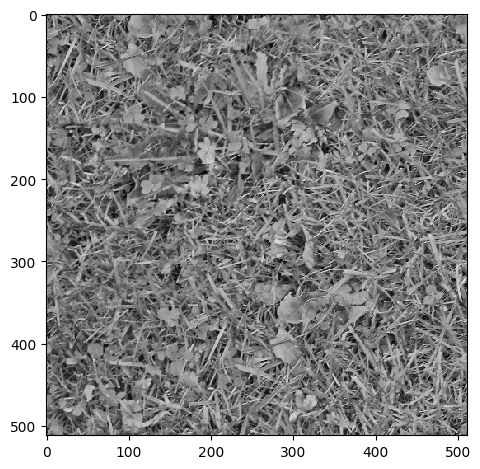

In [44]:
IG = sk.data.grass()
sk.io.show()
sk.io.imshow(IG)

# Find whether the image is grayscale or RGB by the number of channels it has
if IG.ndim == 2:
    print("Grayscale image (1 channel)")
    num_channels = 1
elif IG.ndim == 3:
    num_channels = IG.shape[2]
    print(f"Color image with {num_channels} channels")
else:
    print("Unexpected image format")

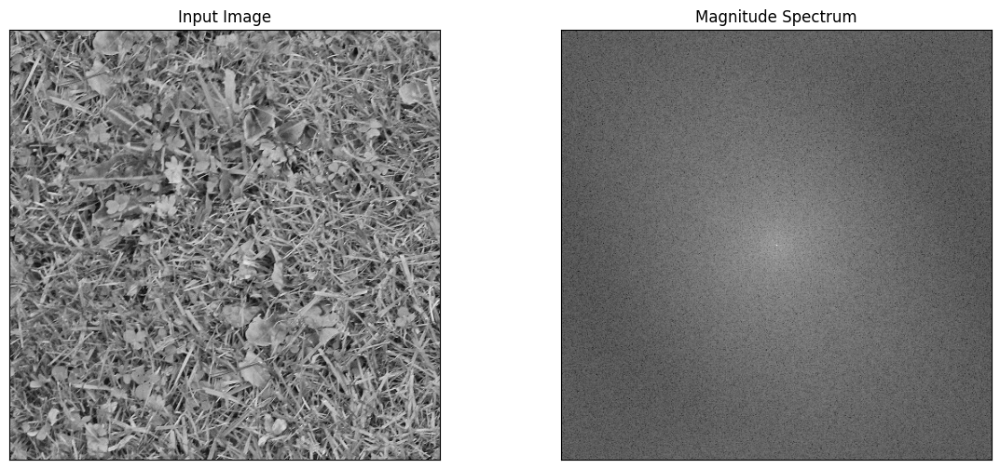

In [45]:
# Obtain the 2D Discrete Fourier Transform of the image (FFT algorithm)

f = np.fft.fft2(IG) # Discrete Fourier Transform using FFT algorithm
fshift = np.fft.fftshift(f) # Shift to have zero frequency (origin) at the center of the image
magnitude_spectrum = 20*np.log(np.abs(fshift)) # Logarithmic scale for better visualization of the differences in powert spectrum

fig = plt.figure(figsize=(14, 6))
plt.subplot(121),plt.imshow(IG, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

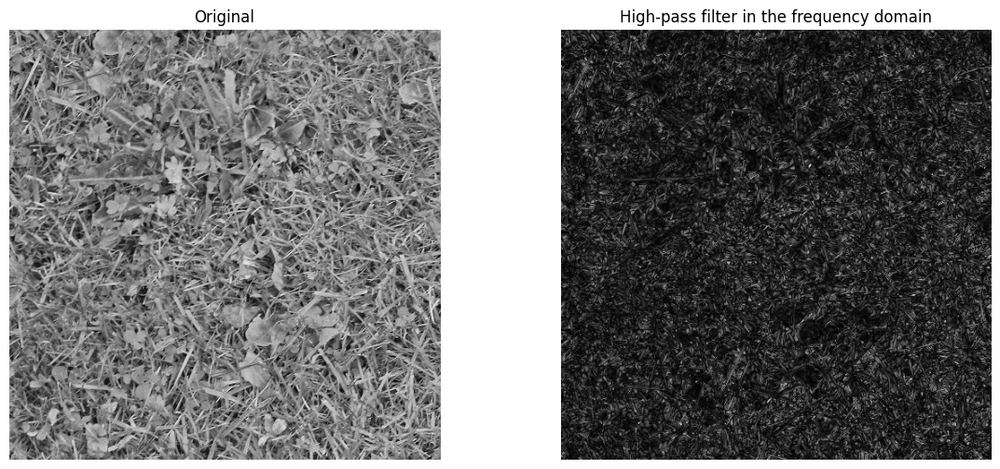

In [48]:
# High-pass filter

# Remove the regions with lower frequencies near the origin of the DFT
rows, cols = IG.shape
crow, ccol = int(rows/2) , int(cols/2)
fshift[crow-30:crow+30, ccol-30:ccol+30] = 0
f_ishift = np.fft.ifftshift(fshift)

# Obtain the filtered image by applying the inverse discrete Fourier transform to the result
IG_back = np.fft.ifft2(f_ishift)
IG_back = np.abs(IG_back)

plot_comparison(IG,IG_back, 'High-pass filter in the frequency domain')

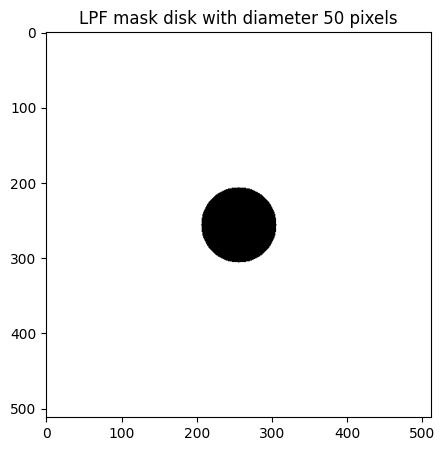

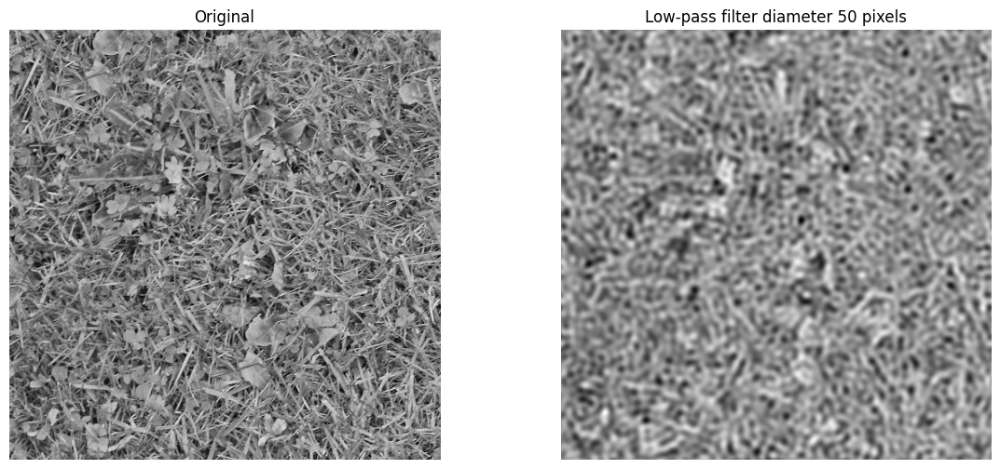

In [51]:
# Low-pass filter

# Remove the regions with higher frequencies far from the origin of the DFT.
# Then obtain the filtered image by applying the inverse discrete Fourier transform to the result
nrows, ncols = IG.shape
row, col = np.ogrid[:nrows, :ncols]
cnt_row, cnt_col = nrows / 2, ncols / 2
disk_diameter = 50
outer_disk_mask = ((row - cnt_row)**2 + (col - cnt_col)**2 > (disk_diameter)**2)

f = np.fft.fft2(IG)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))

fshift[outer_disk_mask] = 0
f_ishift = np.fft.ifftshift(fshift)
IG_back = np.fft.ifft2(f_ishift)
IG_back = np.abs(IG_back)

fig = plt.figure(figsize=(5,5))
plt.imshow(outer_disk_mask,cmap=plt.cm.gray)
plt.title('LPF mask disk with diameter {} pixels'.format(disk_diameter))
plt.show()

plot_comparison(IG, IG_back, 'Low-pass filter diameter {} pixels'.format(disk_diameter))

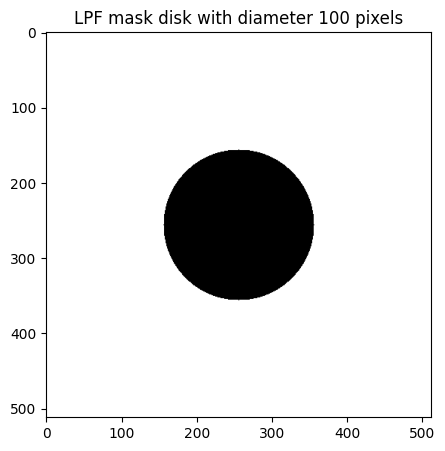

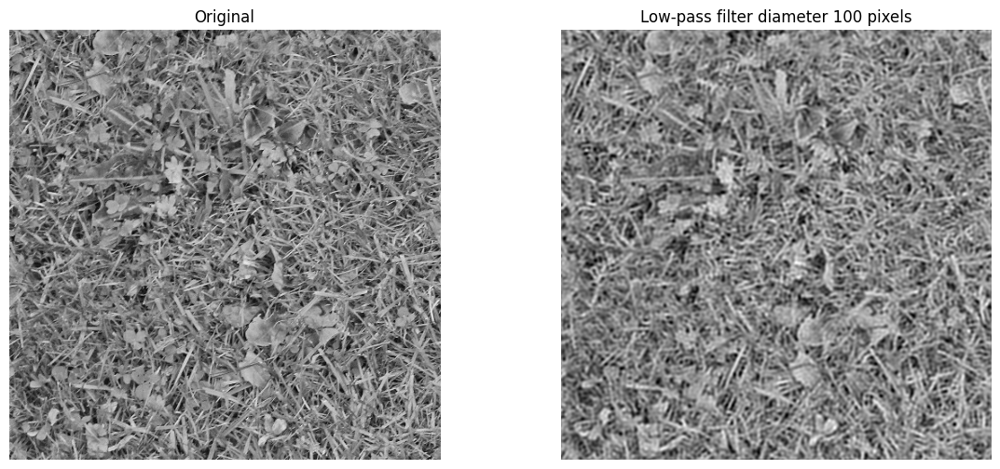

In [28]:
nrows, ncols = IG.shape
row, col = np.ogrid[:nrows, :ncols]
cnt_row, cnt_col = nrows / 2, ncols / 2
disk_diameter = 100
outer_disk_mask = ((row - cnt_row)**2 + (col - cnt_col)**2 > (disk_diameter)**2)

f = np.fft.fft2(IG)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))

fshift[outer_disk_mask] = 0
f_ishift = np.fft.ifftshift(fshift)
IG_back = np.fft.ifft2(f_ishift)
IG_back = np.abs(IG_back)

fig = plt.figure(figsize=(5,5))
plt.imshow(outer_disk_mask,cmap=plt.cm.gray)
plt.title('LPF mask disk with diameter {} pixels'.format(disk_diameter))
plt.show()

plot_comparison(IG, IG_back, 'Low-pass filter diameter {} pixels'.format(disk_diameter))

## Results

After applying the high-pass filter, it is visible that only rapid changes remain: blade edges, fine veins, speckle. Any broad leaf surfaces or smooth shading (low f) have been subtracted, so the image has near-zero average brightness.

Frequencies with periods > 50 px capture large-scale brightness trends (lighting, coarse leaf shapes) but suppress detail. The grainy look is caused by mid-range frequencies that barely sneak through the hard cut-off. There is a strong blur, and the individual blades disappear. On the other hand, when the cutoff is about 100px, the image is still blurred, but groups of blades and leaf edges can be recognised.  Mid-scale structures (leaves, clusters of stems) are restored while the very finest texture is still muted.

High frequencies encode rapid variations: edges, texture, noise. Meanwhile low frequencies encode slow spatial variations: overall brightness, large shapes, illumination gradients.


Number of consecutive erosions needed: 6


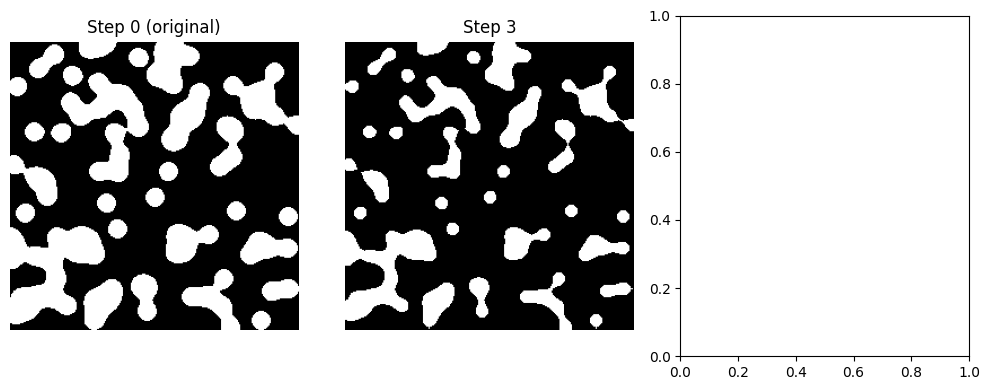

In [63]:
# Generate an image with random blobs and find how many consecutive morphological erosions are needed in order to remove all the blobs
from skimage.morphology import binary_erosion, disk

# Random binary image of blobs, image size (256 × 256), ≈35 % foreground, reproducible blobs
blobs = sk.data.binary_blobs(length=256, volume_fraction=0.35)

# Structuring element (disk radius 3 px)
selem = disk(3)

# Iterate erosion until nothing remains
snapshots = [blobs] # store a few frames for display
current = blobs.copy()
erosion_cnt = 0

while current.any(): # loop until the image is all False
    current = binary_erosion(current, selem)
    erosion_cnt += 1
    # Keep three illustrative frames: start, halfway, final
    if erosion_cnt in (1,  erosion_cnt//2,  None):
        snapshots.append(current)

print(f'Number of consecutive erosions needed: {erosion_cnt}')

# Show original, halfway, and empty result
fig, ax = plt.subplots(1, 3, figsize=(10, 4))
titles  = [f'Step 0 (original)',
           f'Step {erosion_cnt//2}',
           f'Step {erosion_cnt} (empty)']

for a, img, t in zip(ax, snapshots, titles):
    a.imshow(img, cmap='gray', vmin=0, vmax=1)
    a.set_title(t); a.axis('off')

plt.tight_layout(); plt.show()

Number of consecutive erosions needed: 8


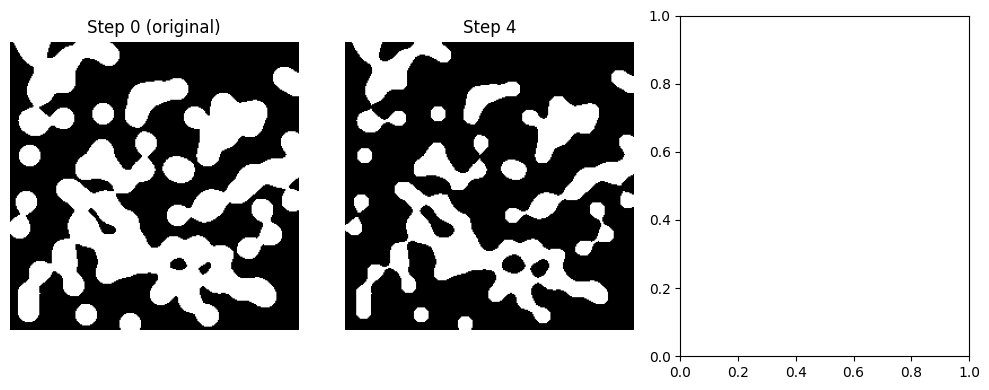

In [62]:
# Random binary image of blobs, image size (256 × 256), ≈42 % foreground, reproducible blobs
blobs = sk.data.binary_blobs(length=256, volume_fraction=0.42)

# Structuring element (disk radius 3 px)
selem = disk(3)

# Iterate erosion until nothing remains
snapshots = [blobs] # store a few frames for display
current = blobs.copy()
erosion_cnt = 0

while current.any(): # loop until the image is all False
    current = binary_erosion(current, selem)
    erosion_cnt += 1
    # Keep three illustrative frames: start, halfway, final
    if erosion_cnt in (1,  erosion_cnt//2,  None):
        snapshots.append(current)

print(f'Number of consecutive erosions needed: {erosion_cnt}')

# Show original, halfway, and empty result
fig, ax = plt.subplots(1, 3, figsize=(10, 4))
titles  = [f'Step 0 (original)',
           f'Step {erosion_cnt//2}',
           f'Step {erosion_cnt} (empty)']

for a, img, t in zip(ax, snapshots, titles):
    a.imshow(img, cmap='gray', vmin=0, vmax=1)
    a.set_title(t); a.axis('off')

plt.tight_layout(); plt.show()